# Install detectron2

In [1]:
# !conda create -n myenv python=3.9 -y
#!source /root/anaconda3/etc/profile.d/conda.sh
#!conda activate myenv

In [2]:
#!python -m pip install pyyaml==5.1
# Detectron2 has not released pre-built binaries for the latest pytorch (https://github.com/facebookresearch/detectron2/issues/4053)
# so we install from source instead. This takes a few minutes.
#!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

# Install pre-built detectron2 that matches pytorch version, if released:
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
#!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/{CUDA_VERSION}/{TORCH_VERSION}/index.html

# exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

In [3]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2021 NVIDIA Corporation
Built on Thu_Nov_18_09:45:30_PST_2021
Cuda compilation tools, release 11.5, V11.5.119
Build cuda_11.5.r11.5/compiler.30672275_0
torch:  1.9 ; cuda:  cu111
detectron2: 0.6


In [4]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
#from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# Run a pre-trained detectron2 model

# Train on a custom dataset

In [5]:
import json
  
# Opening JSON file
f = open('/root/raghav/labelstudio/result.json')
  
dataset_dicts = json.load(f)

In [6]:
dataset_dicts['images'][1]

{'width': 1535,
 'height': 2730,
 'id': 1,
 'file_name': 'images/11/82c7c2ca-11.jpg'}

In [7]:
dataset_dicts['categories']

[{'id': 0, 'name': 'Wire'}]

In [8]:
dataset_dicts.keys()

dict_keys(['images', 'categories', 'annotations', 'info'])

In [9]:
!ls /root/raghav/labelstudio/images/11

03865ad2-25.jpg		765ef5c1-9.jpg	       a525426b-24.jpg
0571f85d-4.jpg		7b2945ef-IMG_0340.JPG  a7bd461c-8.JPG
060aaccc-IMG_0345.JPG	7e632d99-IMG_0306.JPG  a99d9f5b-IMG_0323.JPG
16bee31b-1.jpg		7f355d57-2.JPG	       ab3b01ca-IMG_0352.JPG
1af4a433-IMG_0354.JPG	7fc61b3a-IMG_0318.JPG  abfcc678-IMG_0339.JPG
23c6bf74-5.jpg		82c7c2ca-11.jpg        acef4032-IMG_0342.JPG
2f68429a-IMG_0333.JPG	838b8505-IMG_0330.JPG  b6e1149a-IMG_0329.JPG
30b24faf-21.jpg		83fd0d53-IMG_0304.JPG  bdcfba0e-14.jpg
3576ba5b-20.jpg		859c9222-IMG_0313.JPG  bf411d4c-IMG_0294.JPG
39fa94e9-19.jpg		8b4b117d-IMG_0344.JPG  cd6ea9ce-IMG_0355.JPG
3a9d0723-IMG_0346.JPG	8b92b444-IMG_0322.JPG  ce39d6ee-IMG_0335.JPG
438005ea-IMG_0326.JPG	8cde8e52-3.jpg	       cfb5b88a-IMG_0301.JPG
4946c5fb-IMG_0331.JPG	8ce904be-IMG_0348.JPG  dd70db44-IMG_0343.JPG
4bd013d1-IMG_0303.JPG	8d9688df-17.jpg        de03b894-7.jpg
52df14cb-12.jpg		8f5d6a91-IMG_0332.JPG  dec01bf9-13.jpg
5b1dbf69-IMG_E0297.JPG	9152cc57-IMG_0349.JPG  e0400583-IMG_0347.JPG
5d1b0

In [10]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset8", {}, "/root/raghav/labelstudio/result.json", "/root/raghav/labelstudio/")

In [11]:
#register_coco_instances("my_dataset_val", {}, "json_annotation_val.json", "path/to/image/dir")

In [12]:
# if your dataset is in COCO format, this cell can be replaced by the following three lines:
# from detectron2.data.datasets import register_coco_instances
# register_coco_instances("my_dataset_train", {}, "json_annotation_train.json", "path/to/image/dir")
# register_coco_instances("my_dataset_val", {}, "json_annotation_val.json", "path/to/image/dir")

from detectron2.structures import BoxMode

<!-- To verify the dataset is in correct format, let's visualize the annotations of randomly selected samples in the training set: -->



## Train!

Now, let's fine-tune a COCO-pretrained R50-FPN Mask R-CNN model on the balloon dataset. It takes ~2 minutes to train 300 iterations on a P100 GPU.


In [14]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset8",)
cfg.DATASETS.TEST = ("my_dataset8",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 1000    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

In [15]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

In [16]:
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)

[01/03 13:32:01 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

2023-01-03 13:32:01.913345: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-01-03 13:32:03.289056: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-01-03 13:32:05.476628: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /root/anaconda3/lib/python3.9/site-packages/cv2/../../lib64:
2023-01-03 13:32:05.476749: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dl

In [17]:
#trainer.train()

In [18]:
# Look at training curves in tensorboard:
#%load_ext tensorboard
#%tensorboard --logdir output

## Inference & evaluation using the trained model
Now, let's run inference with the trained model on the balloon validation dataset. First, let's create a predictor using the model we just trained:



In [24]:
cfg.OUTPUT_DIR

'./output'

In [25]:
from detectron2.utils.visualizer import ColorMode
import matplotlib.pyplot as plt
from skimage.io import imshow, imread
from skimage.color import rgb2hsv, hsv2rgb

In [26]:
k=dataset_dicts['images'][5]['file_name']

In [27]:
im = cv2.imread("/root/raghav/labelstudio/"+k,1)

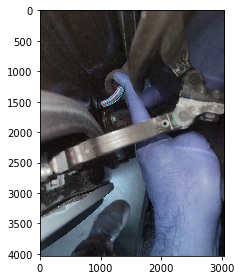

In [28]:
imshow(im)

In [29]:
 #im1=imshow("/root/raghav/labelstudio/wires/images (7).jpeg")

In [30]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[01/03 13:33:19 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                                  | Shapes                                          |
|:------------------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*               | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.bottom_up.res2.0.conv2.*               | backbone.bottom_up.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| backbone.bottom_up.res2.0.conv3.*               | backbone.bottom_up.res2.0.conv3.{norm.bia

Then, we randomly select several samples to visualize the prediction results.

In [31]:
def get_mask(im):
    outputs = predictor(im)
    max_index = outputs['instances'].scores.tolist().index(max(outputs['instances'].scores.tolist()))
    mask = outputs['instances'].pred_masks[max_index].tolist()
    mask = np.array(mask).reshape(im.shape[0],im.shape[1],1)*im
    x1 = outputs['instances'].pred_boxes.tensor.tolist()[max_index][0] 
    y1 = outputs['instances'].pred_boxes.tensor.tolist()[max_index][1]
    x2 = outputs['instances'].pred_boxes.tensor.tolist()[max_index][2]
    y2 = outputs['instances'].pred_boxes.tensor.tolist()[max_index][3]
    #imshow(mask[int(y1):int(y2),int(x1):int(x2),:])
    print(y2,y1,x2,x1,(y2-y1)*(x2-x1))
    return [int(y1),int(y2),int(x1),int(x2)]

In [32]:
im1 = get_mask(im)

/root/anaconda3/lib/python3.9/site-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


1468.1954345703125 1293.2349853515625 1364.9661865234375 1215.608642578125 26131.66298288107


In [33]:
%%time
#-- 5-10 seconds ## Loading to prediction to output

im = imread("/root/raghav/labelstudio/"+k)
outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
v = Visualizer(im[:, :, ::-1],
                scale=0.75, 
                   # remove the colors of unsegmented pixels. This option is only available for segmentation models
)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

CPU times: user 1.3 s, sys: 130 ms, total: 1.43 s
Wall time: 1.3 s


In [34]:
box_dict = {}
for i in dataset_dicts['images']:
    k = i['file_name']
    im = cv2.imread("/root/raghav/labelstudio/"+k)
    try:
        a = get_mask(im)
        box_dict[k] = a
        print(k,a)
    except:
        pass 

2213.11376953125 1993.5338134765625 830.9368896484375 492.2952880859375 74358.90798938274
images/11/bdcfba0e-14.jpg [1993, 2213, 492, 830]
1363.915771484375 1173.44189453125 895.8938598632812 744.4111328125 28853.502312794328
images/11/82c7c2ca-11.jpg [1173, 1363, 744, 895]
2331.93896484375 1381.3143310546875 2074.70458984375 1302.9000244140625 733696.4323683232
images/11/7f355d57-2.JPG [1381, 2331, 1302, 2074]
2240.393310546875 2084.628662109375 1066.9970703125 852.8511962890625 33356.356781601906
images/11/03865ad2-25.jpg [2084, 2240, 852, 1066]
2606.329345703125 2562.671875 1242.3629150390625 1044.86328125 8622.334476023912
images/11/a525426b-24.jpg [2562, 2606, 1044, 1242]
1468.1954345703125 1293.2349853515625 1364.9661865234375 1215.608642578125 26131.66298288107
images/11/a29d1440-23.jpg [1293, 1468, 1215, 1364]
219.8627166748047 178.30796813964844 95.97936248779297 44.45733642578125 2140.9848370286636
images/11/f66ef193-22.jpg [178, 219, 44, 95]
2941.13623046875 2716.9697265625 

Invalid SOS parameters for sequential JPEG


700.133056640625 466.6375427246094 357.508544921875 192.16351318359375 38607.323159189895
images/11/8d9688df-17.jpg [466, 700, 192, 357]
874.297607421875 789.6838989257812 379.7408142089844 239.175537109375 11893.74938117899
images/11/96c90a35-16.jpg [789, 874, 239, 379]
1686.704833984375 1571.3988037109375 1483.6629638671875 1255.39990234375 26320.10748232901
images/11/69db667b-15.JPG [1571, 1686, 1255, 1483]
1818.5491943359375 1453.2490234375 1711.244384765625 634.609619140625 393294.8638780117
images/11/dec01bf9-13.jpg [1453, 1818, 634, 1711]
651.0650634765625 590.3082885742188 497.3738708496094 304.7451477050781 11703.499971818179
images/11/52df14cb-12.jpg [590, 651, 304, 497]
838.8355712890625 776.0136108398438 432.61199951171875 317.3257141113281 7242.510461760685
images/11/e73b6357-10.jpg [776, 838, 317, 432]
459.82696533203125 301.2104187011719 429.2563781738281 168.19210815429688 41409.11295920424
images/11/765ef5c1-9.jpg [301, 459, 168, 429]
2362.1552734375 2119.595703125 196

In [35]:
list(box_dict.items())[0:6]

[('images/11/bdcfba0e-14.jpg', [1993, 2213, 492, 830]),
 ('images/11/82c7c2ca-11.jpg', [1173, 1363, 744, 895]),
 ('images/11/7f355d57-2.JPG', [1381, 2331, 1302, 2074]),
 ('images/11/03865ad2-25.jpg', [2084, 2240, 852, 1066]),
 ('images/11/a525426b-24.jpg', [2562, 2606, 1044, 1242]),
 ('images/11/a29d1440-23.jpg', [1293, 1468, 1215, 1364])]

Instances(num_instances=5, image_height=4032, image_width=1908, fields=[pred_boxes: Boxes(tensor([[ 492.2953, 1993.5338,  830.9369, 2213.1138],
        [ 725.5929, 1968.1691,  854.2525, 2078.5449],
        [ 476.6273, 2176.9695,  594.9737, 2228.3889],
        [ 652.2195, 1976.4672,  850.7067, 2128.5671],
        [ 474.9111, 2165.6458,  605.6243, 2207.3381]], device='cuda:0')), scores: tensor([0.9918, 0.9413, 0.9237, 0.6282, 0.5230], device='cuda:0'), pred_classes: tensor([0, 0, 0, 0, 0], device='cuda:0'), pred_masks: tensor([[[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False]],

        [[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, Fals

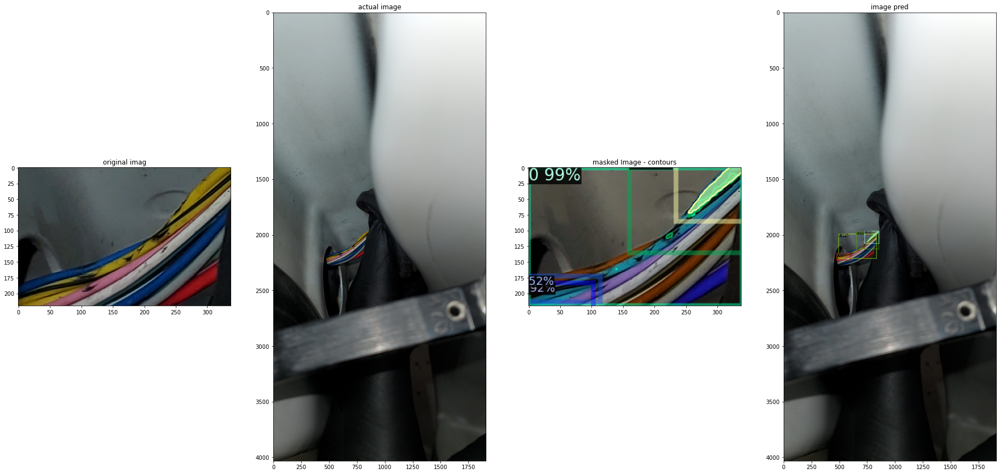

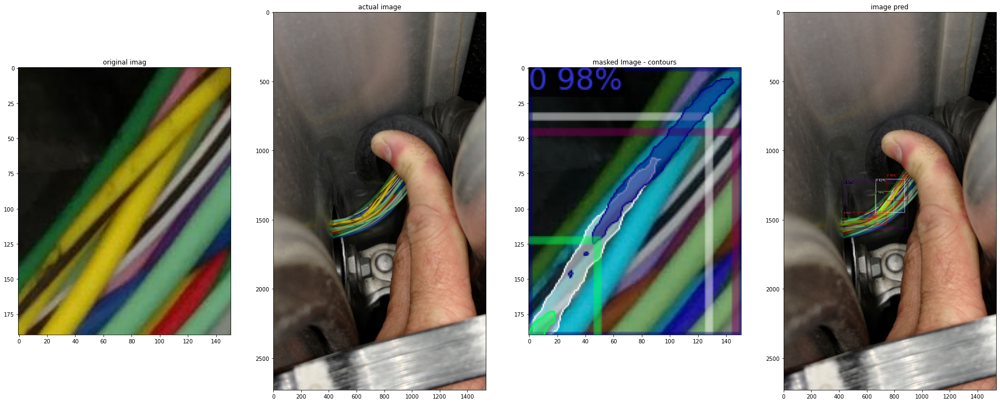

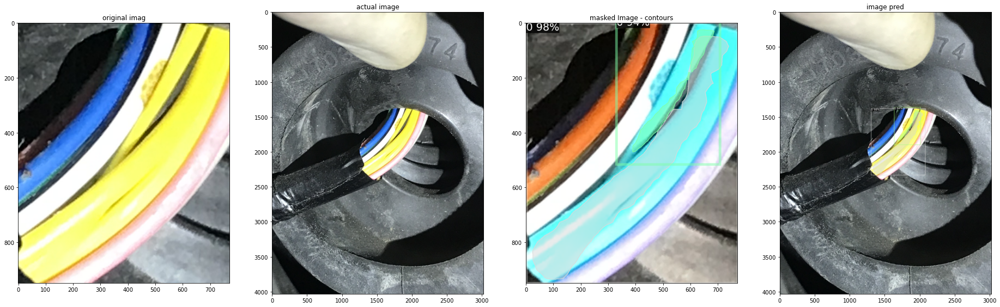

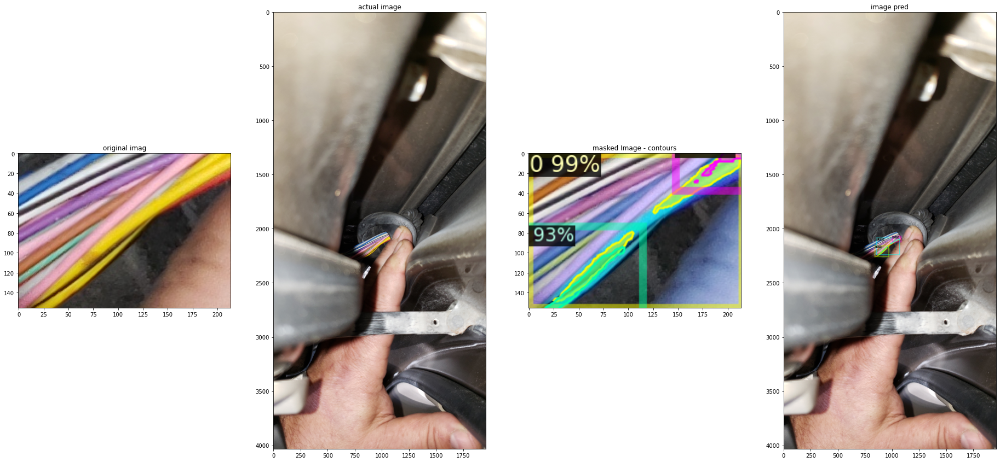

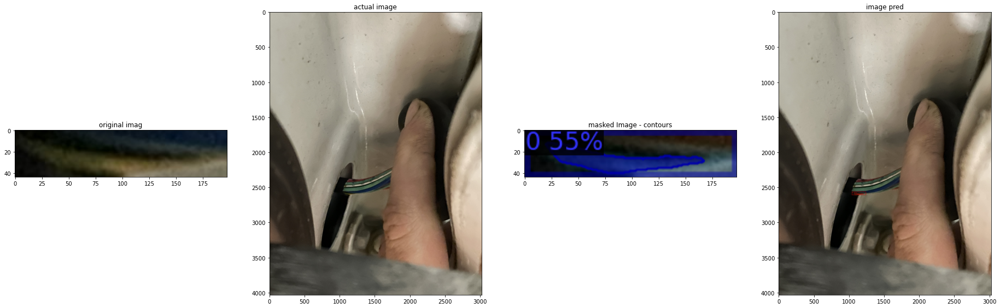

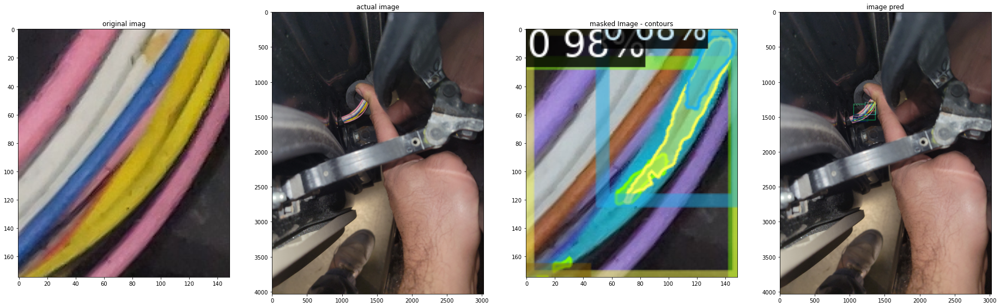

In [37]:
for a,b in list(box_dict.items())[0:6]:
    im = cv2.imread("/root/raghav/labelstudio/"+a)
    outputs = predictor(im) 
    v = Visualizer(im[:, :, ::-1],
                scale=1, 
                #instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
)

    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    actual = im[b[0]:b[1],b[2]:b[3],:]
    #actual = imshow(a)
    #pred = get_mask(b)
    pred = out.get_image()[b[0]:b[1],b[2]:b[3],:]
    #pred = out.get_image(b)
    fig, ax = plt.subplots(1,4, figsize = (32,24))

    ax[0].imshow(actual[:,:,::-1])
    ax[2].imshow(pred[:,:,::-1])
    ax[1].imshow(im[:,:,::-1])
    ax[3].imshow(out.get_image())
    print(outputs['instances'])
    
   
    ax[0].set_title(f"original imag")
    ax[2].set_title(f"masked Image - contours")
    ax[1].set_title('actual image')
    ax[3].set_title('image pred')
    
    
    fig.show()


In [38]:
outputs['instances']

Instances(num_instances=5, image_height=4032, image_width=3024, fields=[pred_boxes: Boxes(tensor([[1215.6086, 1293.2350, 1364.9662, 1468.1954],
        [1054.0917, 1463.2124, 1256.2151, 1563.3062],
        [1053.2366, 1317.3365, 1361.6282, 1544.8196],
        [1268.5144, 1283.4891, 1364.2344, 1413.8016],
        [1045.9758, 1496.9252, 1218.1167, 1571.3212]], device='cuda:0')), scores: tensor([0.9762, 0.9700, 0.8129, 0.6798, 0.6142], device='cuda:0'), pred_classes: tensor([0, 0, 0, 0, 0], device='cuda:0'), pred_masks: tensor([[[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False]],

        [[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, Fals

#### 